In [27]:
import osmnx as ox
import numpy as np
import geopandas as gpd
import pandas as pd
from shapely import wkt
import matplotlib.pyplot as plt
import plotly.express as px
from shapely.geometry import Polygon

place = "Amsterdam, Netherlands"

# 0. Collect all data

Buildings downloaded successfully!
Water features downloaded successfully!
Street network downloaded successfully!


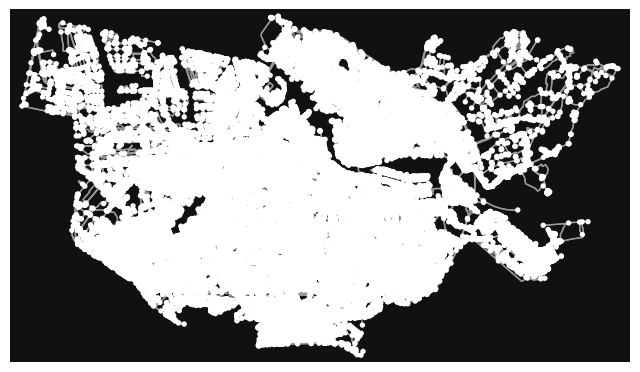

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [11]:
area = ox.geocode_to_gdf(place)


buildings = ox.features_from_place(place, tags={'building': True})
print("Buildings downloaded successfully!")

water = ox.features_from_place(place, tags={'natural': 'water'})
print("Water downloaded successfully!")

streets = ox.graph_from_place(place, network_type='all')
print("Streets downloaded successfully!")     

ox.plot_graph(streets)

In [14]:

buildings.to_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/buildings.geojson", driver="GeoJSON")
water.to_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/water.geojson", driver="GeoJSON")

nodes, edges = ox.graph_to_gdfs(streets)
nodes.to_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/nodes.geojson", driver="GeoJSON")
edges.to_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/streets.geojson", driver="GeoJSON")

# Open Files Here!

In [28]:
buildings = gpd.read_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/buildings.geojson")
water = gpd.read_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/water.geojson")
nodes = gpd.read_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/nodes.geojson")
edges = gpd.read_file("/Users/Mick/Desktop/1.3 Data Systems Project/data/streets.geojson")
trees = pd.read_csv('/Users/Mick/Desktop/1.3 Data Systems Project/data/trees.csv', delimiter=';', index_col='OBJECTNUMMER')
zipcodes = pd.read_csv('/Users/Mick/Desktop/1.3 Data Systems Project/data/zipcodes.csv', sep=';', index_col='Postcode4')

Skipping field highway: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field bridge: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field access: unsupported OGR type: 5
Skipping field service: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5


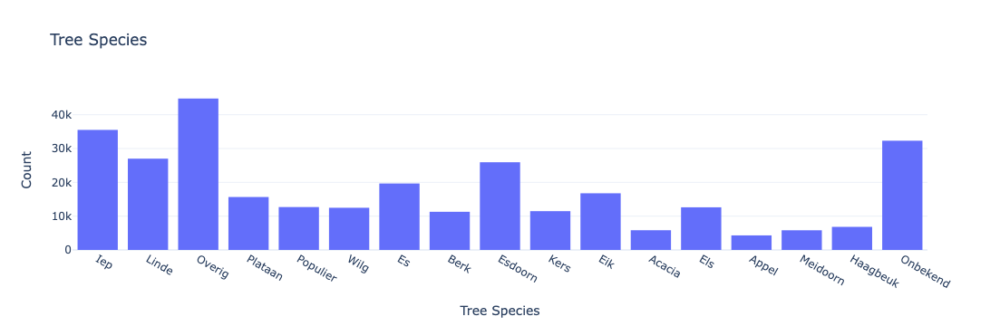

In [29]:
fig = px.histogram(
    trees,
    x='SoortnaamTop15',
    title='Tree Species',
    labels={'SoortnaamTop15': 'Tree Species'},
    template='plotly_white'
)

fig.update_layout(
    xaxis_title="Tree Species",
    yaxis_title="Count",
    bargap=0.2  
)

fig.show()

In [30]:
buildings_polygons = buildings[buildings['element'].isin(['way', 'relation'])].geometry
water_polygons = water.geometry

edges = edges.rename(columns={'u': 'start', 'v': 'end'})
roads_polygons = edges[['start', 'end','oneway', 'geometry']]
nodes = nodes.set_index('osmid')[['street_count','geometry']]


# 1. Decrease size to one zipcode

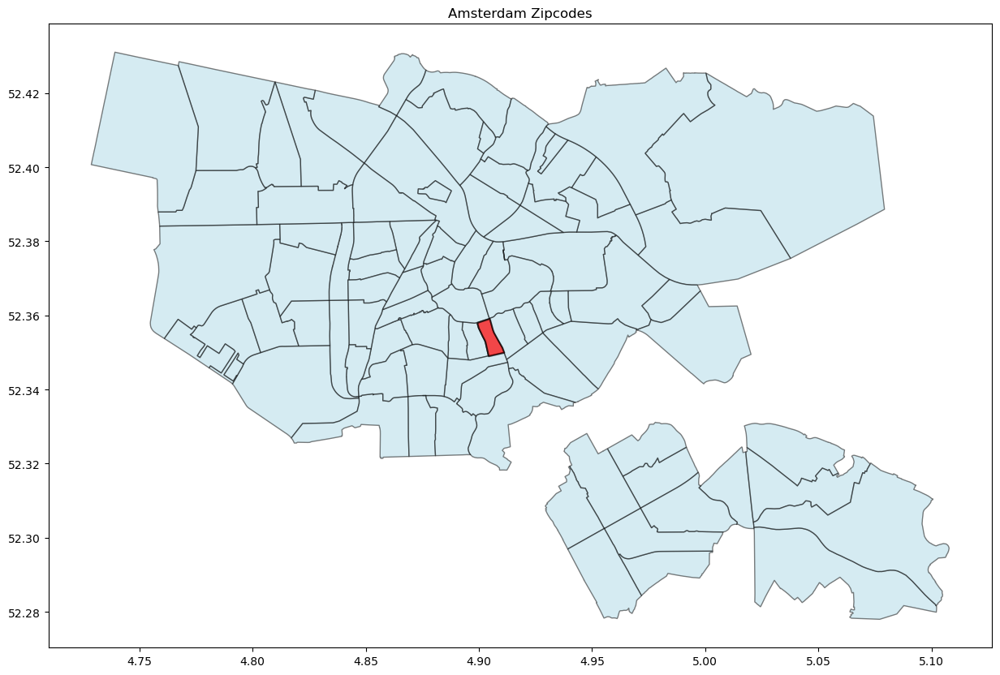

In [31]:


gdf = gpd.GeoDataFrame(
    zipcodes,  
    geometry=zipcodes['WKT_LNG_LAT'].apply(wkt.loads),
    crs="EPSG:4326"
)

fig, ax = plt.subplots(figsize=(15, 15))

gdf.plot(
    ax=ax,
    facecolor='lightblue',  
    edgecolor='black',      
    alpha=0.5,             
    linewidth=1
)

gdf[gdf.index == 1074].plot(
    ax=ax,
    facecolor='red',
    edgecolor='black',  
    alpha=0.7,          
    linewidth=1.5
)


plt.title('Amsterdam Zipcodes')
plt.show()

In [32]:
zipcodes[zipcodes.index == 1037].WKT_LNG_LAT

Postcode4
1037    POLYGON((4.8560849 52.416656,4.8557179 52.4163...
Name: WKT_LNG_LAT, dtype: object

/var/folders/70/p7sg7nvs5zj0gb1rprkw31k40000gp/T/ipykernel_3133/2285806921.py:11: UserWarning:

Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler

/var/folders/70/p7sg7nvs5zj0gb1rprkw31k40000gp/T/ipykernel_3133/2285806921.py:11: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



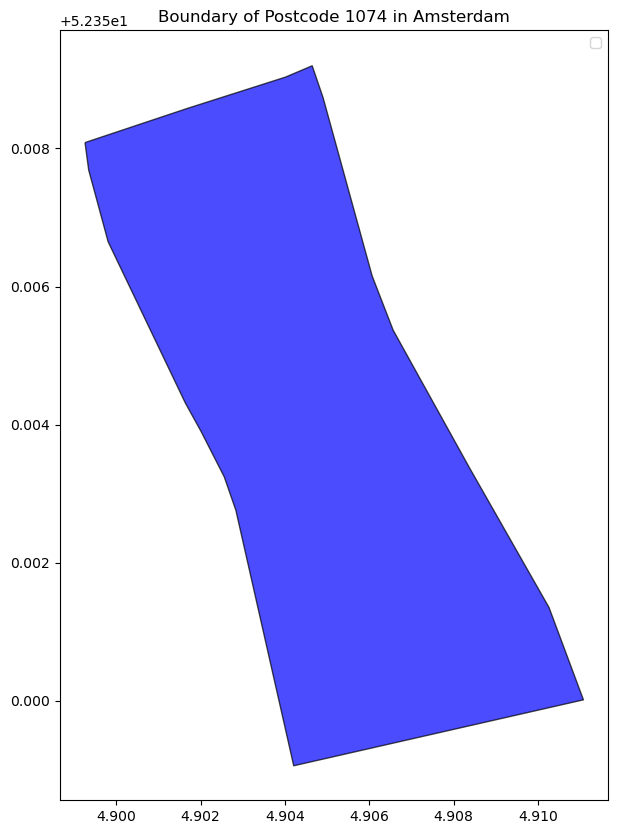

In [33]:
amsterdam_boundary = ox.geocode_to_gdf(place)

postcode_1074 = gdf[gdf.index == 1074]  

fig, ax = plt.subplots(figsize=(10, 10))

postcode_1074.plot(ax=ax, color="blue", edgecolor="black", alpha=0.7, label="Postcode 1074")


plt.title("Boundary of Postcode 1074 in Amsterdam")
plt.legend()
plt.show()

In [34]:
postcode_1074.geometry.bounds.values[0]

array([ 4.8992461, 52.349067 ,  4.911065 , 52.3592051])

# 2. Make into Grid

In [35]:
from shapely.geometry import Polygon


def hexagon(center_x, center_y, size):
    angles = np.linspace(0, 2 * np.pi, 7) 
    x_hex = center_x + size * np.cos(angles)
    y_hex = center_y + size * np.sin(angles)
    return Polygon(zip(x_hex, y_hex))


In [36]:
postcode_1074.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

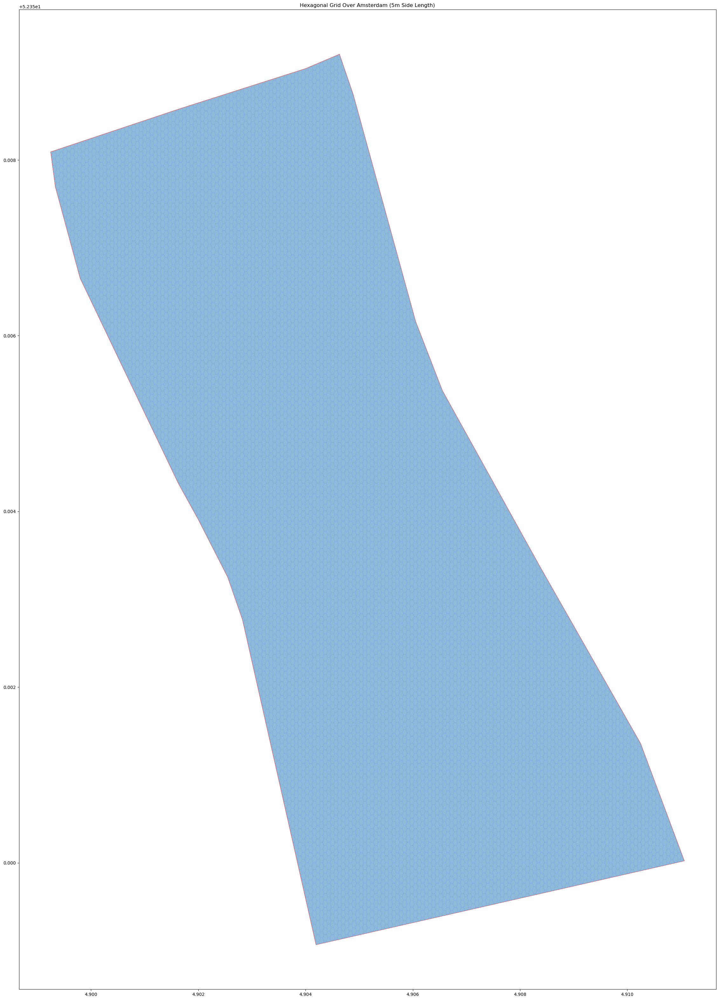

In [37]:
minx, miny, maxx, maxy = postcode_1074.geometry.bounds.values[0]

hex_size = 5 / (111320)  

hexagons = []
x_coords = np.arange(minx, maxx, hex_size * 1.5)  
y_coords = np.arange(miny, maxy, hex_size * np.sqrt(3))  
for i, x in enumerate(x_coords):
    for j, y in enumerate(y_coords):
        # Offset every other column to form the hexagonal grid
        if i % 2 == 0:
            y_offset = y
        else:
            y_offset = y + hex_size * np.sqrt(3) / 2
        hex_cell = hexagon(x, y_offset, hex_size)
        hexagons.append(hex_cell)

hex_grid = gpd.GeoDataFrame(geometry=hexagons, crs=postcode_1074.crs)


hex_grid_clipped = gpd.overlay(hex_grid, postcode_1074, how="intersection")

# Plot the grid
ax = hex_grid_clipped.plot(figsize=(40, 40), edgecolor="blue", linewidth=0.1, alpha=0.5)
postcode_1074.boundary.plot(ax=ax, color="red", linewidth=0.5)
plt.title("Hexagonal Grid Over Amsterdam (5m Side Length)")
plt.show()


In [ ]:
hex_grid_clipped.to_file("data/amsterdam_hexagonal_grid.geojson", driver="GeoJSON")

In [38]:
hex_grid_clipped.geometry

0        POLYGON ((4.89929 52.35794, 4.89928 52.35792, ...
1        POLYGON ((4.89927 52.35805, 4.89929 52.35801, ...
2        POLYGON ((4.89929 52.35809, 4.89927 52.35805, ...
3        POLYGON ((4.89934 52.3577, 4.89936 52.35766, 4...
4        POLYGON ((4.89934 52.35778, 4.89936 52.35774, ...
                               ...                        
11108    POLYGON ((4.91099 52.35004, 4.91095 52.35004, ...
11109    POLYGON ((4.91099 52.35012, 4.91095 52.35012, ...
11110    POLYGON ((4.91095 52.3502, 4.91092 52.35023, 4...
11111    POLYGON ((4.91099 52.35004, 4.91101 52.35008, ...
11112    POLYGON ((4.91101 52.35008, 4.91099 52.35012, ...
Name: geometry, Length: 11113, dtype: geometry

# 3. Set each cell to actor

In [39]:
def check_actor(hexa):
    for tree_wkt in trees.WKT_LNG_LAT:
        tree = wkt.loads(tree_wkt)
        if hexa.intersects(tree):
            print('tree added')
            return 'tree'

    for node_geom in nodes.geometry:
        if hexa.intersects(node_geom):
            print('intersection added')
            return 'intersection'

    for road_geom in roads_polygons.geometry:
        if hexa.intersects(road_geom):
            print('road added')
            return 'road'

    for water_geom in water_polygons.geometry:
        if hexa.intersects(water_geom):
            print('water added')
            return 'water'

    for building_geom in buildings_polygons.geometry:
        if hexa.intersects(building_geom):
            print('building added')
            return 'building'

    print("nothing")
    return None
    

In [40]:
postcode_1074

,OBJECTNUMMER,Opp_m2,WKT_LNG_LAT,WKT_LAT_LNG,LNG,LAT,geometry
Postcode4,,,,,,,
1074,4,429512,"POLYGON((4.8992461 52.3580929,4.899333 52.3576...","POLYGON((52.3580929 4.8992461,52.357696 4.8993...",4.905156,52.354136,"POLYGON ((4.89925 52.35809, 4.89933 52.3577, 4..."


In [137]:
new_df = hex_grid_clipped

In [138]:
new_df['actor'] = None
new_df= new_df[['geometry', 'actor']]

In [141]:
for ind, hexa in enumerate(new_df.geometry):
    new_df.loc[ind, 'actor'] = check_actor(hexa)

road added
water added
water added
road added
road added
road added
road added
road added
road added
road added
road added
road added
road added
intersection added
intersection added
intersection added
intersection added
water added
nothing
nothing
road added
road added
road added
road added
road added
road added
road added
water added
water added
nothing
nothing
road added
road added
road added
building added
building added
road added
road added
road added
road added
water added
water added
nothing
nothing
road added
road added
road added
building added
building added
building added
building added
building added
intersection added
intersection added
intersection added
water added
water added
nothing
nothing
nothing
road added
road added
building added
building added
building added
building added
building added
building added
road added
road added
road added
road added
water added
water added
nothing
nothing
nothing
nothing
nothing
nothing
road added
tree added
building added
building 

KeyboardInterrupt: 

In [51]:
actor_colors = {
    'water': 'blue',
    'intersection': 'darkgrey',
    'road': 'lightgrey',
    'tree': 'green',  
    'building': 'grey'
}

new_df['color'] = new_df['actor'].map(actor_colors).fillna('white')

In [149]:
new_df.to_csv("data/new_df.csv", index=False)

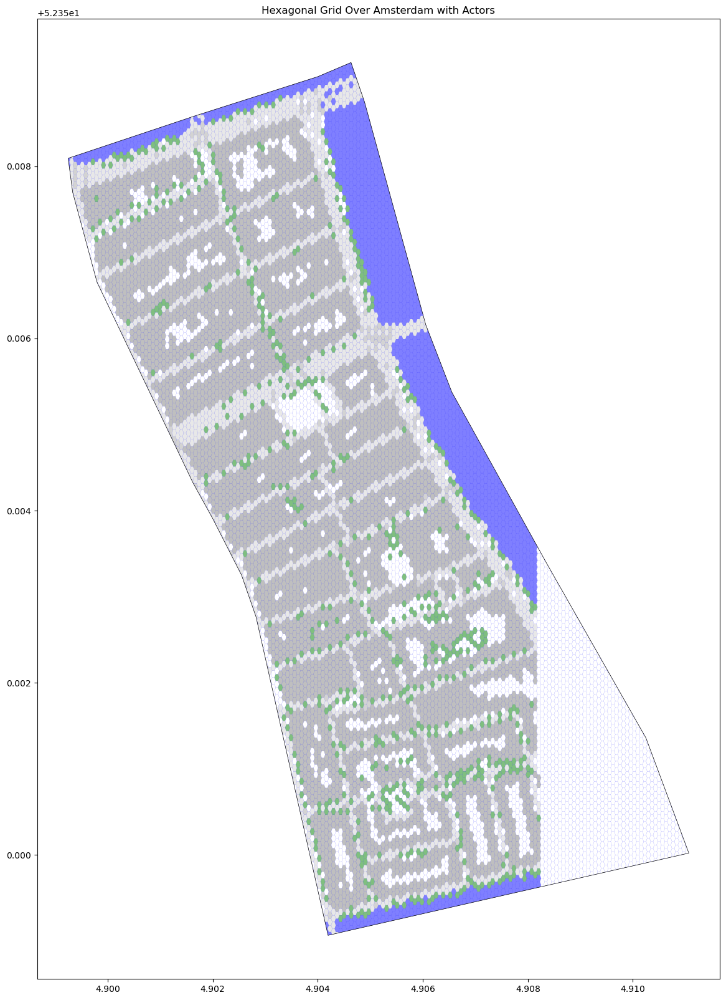

In [71]:
actor_colors = {
    'water': 'blue',
    'intersection': 'darkgrey',
    'road': 'lightgrey',
    'tree': 'green',  
    'building': 'grey'
}

new_df['color'] = new_df['actor'].map(actor_colors).fillna('white')

ax = new_df.plot(
    color=new_df['color'],  
    figsize=(20, 20), 
    edgecolor="blue", 
    linewidth=0.1, 
    alpha=0.5
)


postcode_1074.boundary.plot(ax=ax, color="black", linewidth=0.5)

plt.title("Hexagonal Grid Over Amsterdam with Actors")
plt.show()

In [47]:
new_df = pd.read_csv("data/new_df.csv")

In [8]:
new_df['geometry'] = new_df['geometry'].apply(wkt.loads)
new_df =gpd.GeoDataFrame(new_df, geometry='geometry')

,geometry,actor,color
0,"POLYGON ((4.89929101555875 52.35793574739795, ...",road,lightgrey
1,"POLYGON ((4.899268557779375 52.35805244144266,...",water,blue
2,"POLYGON ((4.89929101555875 52.358091339457566,...",water,blue
3,POLYGON ((4.899335931117499 52.357702359308526...,road,lightgrey
4,"POLYGON ((4.899335931117499 52.35778015533833,...",road,lightgrey
...,...,...,...
11108,"POLYGON ((4.91099151861303 52.350039450372584,...",NaN,white
11109,"POLYGON ((4.91099151861303 52.35011724640239, ...",NaN,white
11110,"POLYGON ((4.91094660305428 52.3501950424322, 4...",NaN,white
11111,"POLYGON ((4.91099151861303 52.35003945037258, ...",NaN,white


# 4. Decrease size to one intersection/road

In [161]:
amsteldijk_box = Polygon([
    (xmin + x_margin*1.3, ymin + y_margin*2),
    (xmax - x_margin, ymin + y_margin*2),
    (xmax - x_margin, ymax - y_margin), 
    (xmin + x_margin*1.3, ymax - y_margin),
])

amsteldijk_intersection = gpd.GeoDataFrame(
    {'geometry': [amsteldijk_box]},
    crs=postcode_1074.crs 
)


amsteldijk_intersection

,geometry
0,"POLYGON ((4.90309 52.35414, 4.90811 52.35414, ..."


In [143]:
indices_amsteldijk = new_df[new_df.geometry.intersects(amsteldijk_intersection.geometry.iloc[0])].index

In [144]:
amstel_dijk_polygon = new_df.loc[indices_amsteldijk]

In [162]:
for ind, hexa in enumerate(amstel_dijk_polygon.geometry):
    amstel_dijk_polygon.loc[ind, 'actor'] = check_actor(hexa)

road added
building added
building added
building added
building added
building added
building added
tree added
building added
building added
building added
building added
building added
building added
road added
road added
road added
tree added
road added
building added
building added
building added
building added
building added
tree added
tree added
road added
tree added
building added
building added
building added
building added
building added
building added
road added
tree added
building added
building added
building added
building added
building added
road added
building added
building added
building added
building added
building added
nothing
intersection added
intersection added
road added
road added
building added
building added
building added
building added
tree added
road added
tree added
building added
road added
building added
building added
building added
building added
building added
nothing
building added
road added
building added
building added
building added
building a

In [214]:
amstel_dijk_polygon

,index,geometry,actor,color,min_lat,max_lat,mean_lat
0,2658,"POLYGON ((4.90311 52.35412, 4.90306 52.35412, ...",road,lightgrey,52.354124,52.354202,52.354163
1,2659,"POLYGON ((4.90311 52.3542, 4.90306 52.3542, 4....",building,grey,52.354202,52.354279,52.354240
2,2660,"POLYGON ((4.90311 52.35428, 4.90306 52.35428, ...",building,grey,52.354279,52.354357,52.354318
3,2661,"POLYGON ((4.90311 52.35436, 4.90306 52.35436, ...",building,grey,52.354357,52.354435,52.354396
4,2662,"POLYGON ((4.90311 52.35443, 4.90306 52.35443, ...",building,grey,52.354435,52.354513,52.354474
...,...,...,...,...,...,...,...
1797,9351,"POLYGON ((4.90751 52.35428, 4.90749 52.35432, ...",water,blue,52.354279,52.354335,52.354307
1798,9411,"POLYGON ((4.90762 52.35408, 4.90758 52.35408, ...",water,blue,52.354085,52.354163,52.354124
1799,9412,"POLYGON ((4.90762 52.35416, 4.90758 52.35416, ...",water,blue,52.354163,52.354240,52.354202
1800,9413,"POLYGON ((4.90758 52.35424, 4.90757 52.35426, ...",water,blue,52.354240,52.354258,52.354249


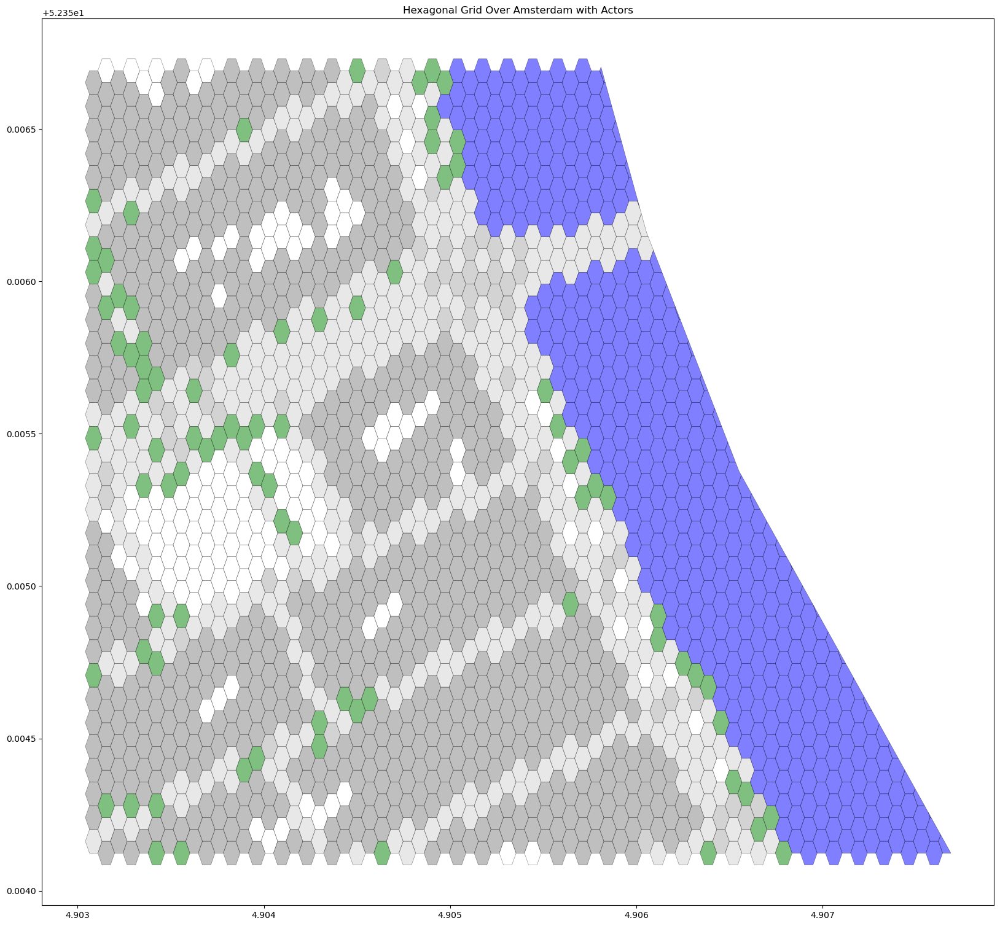

In [217]:
ax = amstel_dijk_polygon.plot(
    color=amstel_dijk_polygon['color'],  
    figsize=(20, 20), 
    edgecolor="black", 
    linewidth=0.4, 
    alpha=0.5
)


amstel_dijk_polygon.boundary.plot(ax=ax, color="black", linewidth=0)

plt.title("Hexagonal Grid Over Amsterdam with Actors")
plt.show()

In [304]:
amstel_dijk_polygon.crs = postcode_1074.crs
output_df = amstel_dijk_polygon[['geometry', 'actor', 'color']]

In [305]:
output_df.geometry.bounds

,minx,miny,maxx,maxy
0,4.903041,52.354124,4.903131,52.354202
1,4.903041,52.354202,4.903131,52.354279
2,4.903041,52.354279,4.903131,52.354357
3,4.903041,52.354357,4.903131,52.354435
4,4.903041,52.354435,4.903131,52.354513
...,...,...,...,...
1797,4.907488,52.354279,4.907548,52.354335
1798,4.907555,52.354085,4.907645,52.354163
1799,4.907555,52.354163,4.907635,52.354240
1800,4.907568,52.354240,4.907584,52.354258


# 5. Add grid coordinates besides geometric coordinates

In [306]:
output_df['x'] = [geom.bounds[0] for geom in output_df.geometry]
output_df['y'] = [geom.bounds[1] for geom in output_df.geometry]


output_df.head()

/opt/anaconda3/envs/DL/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/envs/DL/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,geometry,actor,color,x,y
0,"POLYGON ((4.90311 52.35412, 4.90306 52.35412, ...",road,lightgrey,4.903041,52.354124
1,"POLYGON ((4.90311 52.3542, 4.90306 52.3542, 4....",building,grey,4.903041,52.354202
2,"POLYGON ((4.90311 52.35428, 4.90306 52.35428, ...",building,grey,4.903041,52.354279
3,"POLYGON ((4.90311 52.35436, 4.90306 52.35436, ...",building,grey,4.903041,52.354357
4,"POLYGON ((4.90311 52.35443, 4.90306 52.35443, ...",building,grey,4.903041,52.354435


In [307]:
x_dict = {cor: x for x, cor in enumerate(sorted(output_df['x'].unique()))}
y_dict = {cor: y for y, cor in enumerate(sorted(output_df['y'].unique(), reverse=True))}

In [308]:
output_df['x'] = output_df['x'].apply(lambda x: x_dict[x])
output_df['y'] = output_df['y'].apply(lambda y: y_dict[y])

/opt/anaconda3/envs/DL/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [310]:
output_df = output_df[output_df['y'] != 11]
output_df['y'] = output_df['y'].apply(lambda val: val - 1 if val > 11 else val)

In [311]:
output_df = output_df[output_df['x'] != 57]
output_df['x'] = output_df['x'].apply(lambda val: val - 1 if val > 57 else val)

output_df = output_df[output_df['x'] != 59]
output_df['x'] = output_df['x'].apply(lambda val: val - 1 if val > 59 else val)

output_df = output_df[output_df['x'] != 68]
output_df['x'] = output_df['x'].apply(lambda val: val - 1 if val > 68 else val)

In [315]:
output_df['y'] = output_df['y'].apply(lambda val: val - 1 if val % 2 == 0 else val)
output_df['y'] = output_df['y'] // 2

In [323]:
output_df.to_file("data/amstel_dijk_polygon.geojson", driver="GeoJSON")

[01/22/25 18:23:33] INFO     Created 1,798 records                                                       ]8;id=139005;file:///opt/anaconda3/envs/DL/lib/python3.10/site-packages/pyogrio/raw.py\raw.py]8;;\:]8;id=391765;file:///opt/anaconda3/envs/DL/lib/python3.10/site-packages/pyogrio/raw.py#723\723]8;;\